In [61]:
import pandas as pd
import numpy as np
import os.path
import numpy as np
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
import statsmodels.formula.api as smf

from sklearn.linear_model import Lasso, Ridge, ElasticNet, LinearRegression, LassoCV, RidgeCV, ElasticNetCV

from sklearn.pipeline import make_pipeline

from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import (cross_val_score, train_test_split, 
                                     KFold, GridSearchCV)
import scipy.stats as stats


from sklearn.metrics import r2_score, mean_squared_error

from statsmodels.stats.outliers_influence import variance_inflation_factor

In [178]:
import warnings
warnings.filterwarnings("ignore")

In [64]:
nba = pd.read_csv('nba_v3.csv')

In [66]:
nba.columns

Index(['Unnamed: 0', 'Name', 'Team', 'Age', 'Games', 'Games_Start', 'Min_PG',
       'Field_Goals', 'Field_Goals_Attempts', '3Point_Goals',
       '3Point_Goals_Attempts', '2Point_Goals', '2Point_Goals_Attempts',
       'Effective_Field_Goal_Per', 'Free_Throw', 'Free_Throw_Attempts',
       'Offensive_Rebounds', 'Defensive_Rebounds', 'Assists', 'Steals',
       'Blocks', 'Turnovers', 'Points', 'Position', 'Year', 'Salary'],
      dtype='object')

In [68]:
nba = nba.drop('Unnamed: 0', axis = 1)

In [69]:
nba.head()

,Name,Team,Age,Games,Games_Start,Min_PG,Field_Goals,Field_Goals_Attempts,3Point_Goals,3Point_Goals_Attempts,...,Offensive_Rebounds,Defensive_Rebounds,Assists,Steals,Blocks,Turnovers,Points,Position,Year,Salary
0,Zion Williamson,NOP,20,61,61,33.2,10.4,17.0,0.2,0.6,...,2.7,4.5,3.7,0.9,0.6,2.7,27.0,Power Forward,2021,10245480.0
1,Zeke Nnaji,DEN,20,42,1,9.5,1.2,2.5,0.6,1.4,...,0.3,1.2,0.2,0.2,0.1,0.2,3.2,Power Forward,2021,2379840.0
2,Zach LaVine,CHI,25,58,58,35.1,9.8,19.4,3.4,8.2,...,0.6,4.4,4.9,0.8,0.5,3.5,27.4,Shooting Guard and Point Guard,2021,19500000.0
3,Yuta Watanabe,TOR,26,50,4,14.5,1.6,3.6,0.7,1.8,...,0.7,2.5,0.8,0.5,0.4,0.4,4.4,Small Forward,2021,3218930.0
4,Willy Hernangómez,NOP,26,47,12,18.0,3.2,5.7,0.0,0.2,...,2.5,4.6,1.1,0.5,0.5,0.7,7.8,Center,2021,1737145.0


# Model 1 - All Numerical Features

The initial model is with all numerical features using Salary data without outliers. 

In [70]:
nba_v1= nba._get_numeric_data()

X, y = nba_v1.drop(columns = ['Salary','Year']), nba_v1['Salary']

In [71]:
#Split the data into test/train

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [74]:
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

In [78]:
lin_reg = LinearRegression()

scores = cross_val_score(lin_reg, X_train, y_train, cv=kfold)
print(scores)
print("Linear Reg Mean R Squared Score: ", np.mean(scores))

# Build the Model
lin_reg.fit(X_train, y_train)

[0.44538554 0.48998803 0.48689759 0.46577641 0.5780103 ]
Linear Reg Mean R Squared Score:  0.4932115763235078


LinearRegression()

cross_val_scores vary between 44% and 57% (13% higher the lowest one).
which implies overfitting. 

In [86]:
print('Feature coefficient results for the Model 1 with All Numerical Features: \n')
for feature, coef in zip(X_train.columns, lin_reg.coef_):
    print(feature, ':', f'{coef:.2f}') 

    
# score fit model on test data
print('R Square for the train data :', lin_reg.score(X_train,y_train))
print('R Square for the test data:', lin_reg.score(X_test,y_test))
        

Feature coefficient results for the Model 1 with All Numerical Features: 

Age : 603017.25
Games : -55586.41
Games_Start : 38849.03
Min_PG : -117364.21
Field_Goals : 7532638.82
Field_Goals_Attempts : 215611.21
3Point_Goals : 2541072.02
3Point_Goals_Attempts : -1273736.00
2Point_Goals : -2645055.57
2Point_Goals_Attempts : -396566.64
Effective_Field_Goal_Per : -12713335.53
Free_Throw : 1340848.25
Free_Throw_Attempts : 1340848.25
Offensive_Rebounds : 891696.72
Defensive_Rebounds : 818525.20
Assists : 771060.44
Steals : 853155.66
Blocks : 351663.63
Turnovers : -1289442.86
Points : -1777229.69
R Square for the train data : 0.5274903847393296
R Square for the test data: 0.5599475783041215


In [88]:
def diagnostic_plots(y_pred, y_true, resid):
    fig, axes = plt.subplots(1, 3, figsize=(10, 4))

    g1 = sns.regplot(x=y_pred, y=y_true, ci=False, fit_reg=False, line_kws={'color': 'blue'}, ax=axes[0], scatter_kws={'s': 5})
    g1.set_xlabel('Predicted Target')
    g1.set_ylabel('True Target')
    g1.plot(y_true, y_true, '--', color='gray')

    g2 = sns.regplot(x=y_pred, y=resid, lowess=True, ax=axes[1], line_kws={'color': 'red'}, scatter_kws={'s': 5})
    g2.set_xlabel('Predicted Target')
    g2.set_ylabel('Residual')
    g2.axhline(y=0, color='gray', linestyle='--')

    stats.probplot(resid, dist="norm", plot=axes[2])

    fig.suptitle('Diagnostic Plots');
    fig.tight_layout();

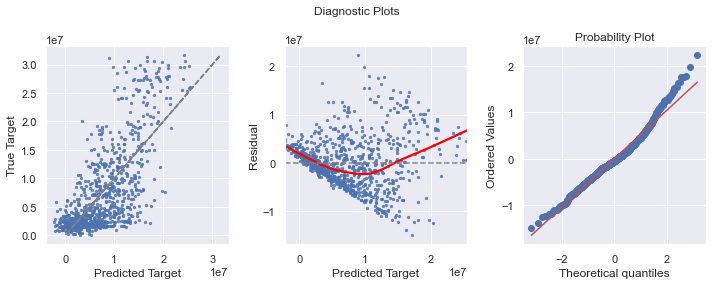

In [90]:
y_pred_linreg = y_train - lin_reg.predict(X_train)
diagnostic_plots(lin_reg.predict(X_train), y_train, y_pred_linreg)


plt.savefig('diagnosticwithAllFeatures', dpi=500, bbox_inches='tight');

The diagnostic plots indicate that a nonlinear model might be a better fit to the data. Transforming the target variable might also be helpful to increase the model efficiency since the Salary variable is skewed since one of the assumptions of Linear Regression is the normal distribution of the predictor variable. Ps: please refer to the section 'Skewness' in EDA notebook for more information.

In [1]:
def split_and_validate(X, y):
    '''
    For a set of features and target X, y, perform a 80/20 train/val split, 
    fit and validate a linear regression model, and report results
    '''
    
    # perform train/val split
    X_train, X_val, y_train, y_val = \
        train_test_split(X, y, test_size=0.2, random_state=42)
    
    # fit linear regression to training data
    lr_model = LinearRegression()
    lr_model.fit(X_train, y_train)
    
    # score fit model on validation data
    val_score = lr_model.score(X_val, y_val)
    
    # report results
    print('\nValidation R^2 score was:', val_score)
    print('Feature coefficient results: \n')
    for feature, coef in zip(X.columns, lr_model.coef_):
        print(feature, ':', f'{coef:.2f}') 
        

In [230]:
def MAE(actuals, preds): #mean absolute error
    return np.mean(np.abs(actuals-preds))



# Feature Enginering 

Multicollinearity, nonlinearity and skewness all affect the model performance. In this section, I will suggest solutions to these issues and try to improve the model. 

## Model 1.a - Linear Regreesion All Numerical Features, Salary in millions

In [117]:
nba['Salary_Mil'] = nba['Salary'] / (1000000) # Salary in Million

In [118]:
nba_v1= nba._get_numeric_data()

X, y = nba_v1.drop(columns = ['Salary','Year', 'Salary_Mil']), nba_v1['Salary_Mil']


#Split the data into test/train

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


lin_reg = LinearRegression()

scores = cross_val_score(lin_reg, X_train, y_train, cv=kfold)
print(scores)
print("Linear Reg Mean R Squared Score: ", np.mean(scores))

# Build the Model
lin_reg.fit(X_train, y_train)


print('Feature coefficient results for the Model 1 with All Numerical Features: \n')
for feature, coef in zip(X_train.columns, lin_reg.coef_):
    print(feature, ':', f'{coef:.2f}') 

    
# score fit model on test data
print('R Square for the train data :', lin_reg.score(X_train,y_train))
print('R Square for the test data:', lin_reg.score(X_test,y_test))


[0.44538554 0.48998803 0.48689759 0.46577641 0.5780103 ]
Linear Reg Mean R Squared Score:  0.4932115763235078
Feature coefficient results for the Model 1 with All Numerical Features: 

Age : 0.60
Games : -0.06
Games_Start : 0.04
Min_PG : -0.12
Field_Goals : 7.53
Field_Goals_Attempts : 0.22
3Point_Goals : 2.54
3Point_Goals_Attempts : -1.27
2Point_Goals : -2.65
2Point_Goals_Attempts : -0.40
Effective_Field_Goal_Per : -12.71
Free_Throw : 1.34
Free_Throw_Attempts : 1.34
Offensive_Rebounds : 0.89
Defensive_Rebounds : 0.82
Assists : 0.77
Steals : 0.85
Blocks : 0.35
Turnovers : -1.29
Points : -1.78
R Square for the train data : 0.5274903847393295
R Square for the test data: 0.5599475783041213


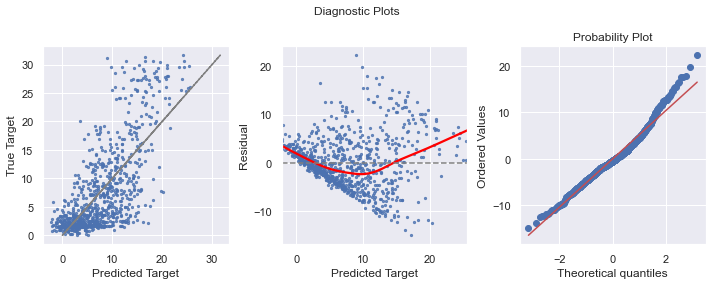

In [119]:
y_pred_linreg = y_train - lin_reg.predict(X_train)
diagnostic_plots(lin_reg.predict(X_train), y_train, y_pred_linreg)


plt.savefig('diagnosticwithAllFeatures', dpi=500, bbox_inches='tight');

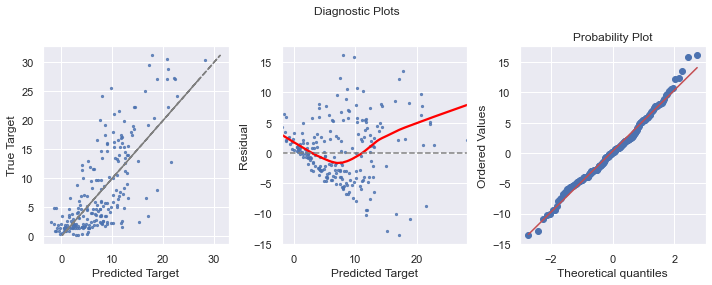

In [201]:
#y_pred_linreg = y_train - lin_reg.predict(X_train)
diagnostic_plots(lin_reg.predict(X_test), y_test,  y_test - lin_reg.predict(X_test))


plt.savefig('diagnosticwithAllFeaturesTest', dpi=500, bbox_inches='tight');

In [231]:
print('MAE for the train data :', MAE(y_train,y_pred_linreg))
print('MAE for the train data :', MAE(y_test,y_test - lin_reg.predict(X_test) ))

MAE for the train data : 7.57918447750756
MAE for the train data : 7.66546321862002


# Model 1.b  - Lasso Linear Regression Model

In [213]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import lars_path
from sklearn.linear_model import ElasticNet



In [202]:
#Feature scaling for train, val, and test so that we can run our ridge model on each
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train.values)
X_test_scaled = scaler.transform(X_test.values)

In [204]:
# use grid search to find alpha
alpha = np.logspace(-4, 2, 100)
param_grid = dict(alpha=alpha)
#dict(lasso_alpha=alpha)



#Setting up a pipeline
#pipe = Pipeline([('scale', StandardScaler()), ('lasso', Lasso())])


#setting up the grid search
grid=GridSearchCV(Lasso(),param_grid ,scoring='r2',cv=kfold)

#GridSearchCV(pipe,param_grid ,scoring='r2',cv=kfold)


#fitting grid search to training data
grid_result = grid.fit(X_train_scaled, y_train)

# View best parameter
print('Best Score: ', grid_result.best_score_)
print('Best Param: ', grid_result.best_params_)

Best Score:  0.5001729203841289
Best Param:  {'alpha': 0.08111308307896872}


In [189]:
pipe.get_params().keys()


dict_keys(['memory', 'steps', 'verbose', 'scale', 'lasso', 'scale__copy', 'scale__with_mean', 'scale__with_std', 'lasso__alpha', 'lasso__copy_X', 'lasso__fit_intercept', 'lasso__max_iter', 'lasso__normalize', 'lasso__positive', 'lasso__precompute', 'lasso__random_state', 'lasso__selection', 'lasso__tol', 'lasso__warm_start'])

In [192]:
lr_model_lasso = LassoCV(alphas= [0.08111308307896872], cv = kfold)
lr_model_lasso.fit(X_train_scaled, y_train)

print('Feature coefficient results for the Lasso with All Numerical Features: \n')
for feature, coef in zip(X_train.columns, lr_model_lasso.coef_):
    print(feature, ':', f'{coef:.2f}') 

    
# score fit model on test data
print('R Square for the train data :', lr_model_lasso.score(X_train_scaled, y_train))
print('R Square for the test data:', lr_model_lasso.score(X_test_scaled, y_test))


Feature coefficient results for the Lasso with All Numerical Features: 

Age : 2.40
Games : -0.79
Games_Start : 0.72
Min_PG : -0.00
Field_Goals : 0.00
Field_Goals_Attempts : 0.00
3Point_Goals : 0.04
3Point_Goals_Attempts : 0.00
2Point_Goals : 0.00
2Point_Goals_Attempts : 0.00
Effective_Field_Goal_Per : -0.25
Free_Throw : 0.38
Free_Throw_Attempts : 0.00
Offensive_Rebounds : 0.30
Defensive_Rebounds : 1.38
Assists : 0.62
Steals : 0.12
Blocks : 0.00
Turnovers : -0.00
Points : 2.56
R Square for the train data : 0.5190728483415107
R Square for the test data: 0.5593458698291537


In [148]:
X_train.columns

Index(['Age', 'Games', 'Games_Start', 'Min_PG', 'Field_Goals',
       'Field_Goals_Attempts', '3Point_Goals', '3Point_Goals_Attempts',
       '2Point_Goals', '2Point_Goals_Attempts', 'Effective_Field_Goal_Per',
       'Free_Throw', 'Free_Throw_Attempts', 'Offensive_Rebounds',
       'Defensive_Rebounds', 'Assists', 'Steals', 'Blocks', 'Turnovers',
       'Points'],
      dtype='object')

Computing regularization path using the LARS ...


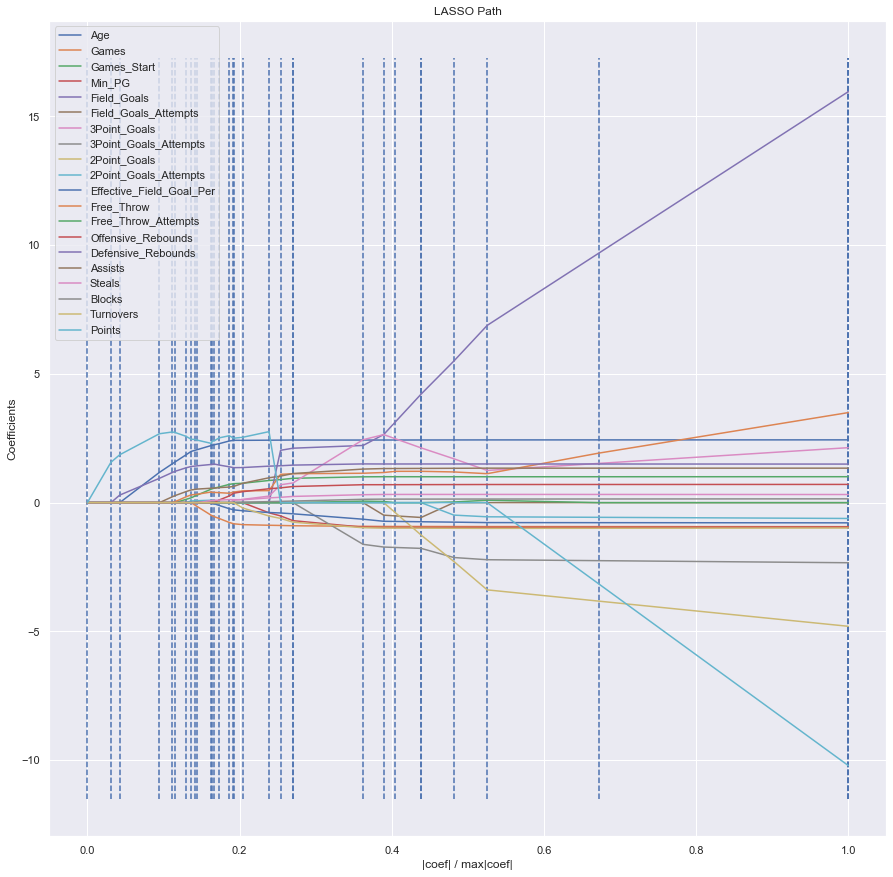

In [151]:
print("Computing regularization path using the LARS ...")
alphas, _, coefs = lars_path(X_train_scaled, y_train, 
                             method='lasso')


# plotting the LARS path

xx = np.sum(np.abs(coefs.T), axis=1)
xx /= xx[-1]

plt.figure(figsize=(15,15))
plt.plot(xx, coefs.T)
ymin, ymax = plt.ylim()
plt.vlines(xx, ymin, ymax, linestyle='dashed')
plt.xlabel('|coef| / max|coef|')
plt.ylabel('Coefficients')
plt.title('LASSO Path')
plt.axis('tight')
plt.legend(['Age', 'Games', 'Games_Start', 'Min_PG', 'Field_Goals',
       'Field_Goals_Attempts', '3Point_Goals', '3Point_Goals_Attempts',
       '2Point_Goals', '2Point_Goals_Attempts', 'Effective_Field_Goal_Per',
       'Free_Throw', 'Free_Throw_Attempts', 'Offensive_Rebounds',
       'Defensive_Rebounds', 'Assists', 'Steals', 'Blocks', 'Turnovers',
       'Points'])
plt.show()

# Model 1.c - Ridge Linear Regression Model

In [207]:
#putting together a parameter grid to search over using grid search
param_R={
    'fit_intercept':[True,False],
    'alpha':np.logspace(-4, 2, 100)
}


#Setting up a pipeline
#pipeR = Pipeline([('scale', StandardScaler()), ('ridge', Ridge())])


#setting up the grid search
grid_ridge=GridSearchCV(Ridge(),param_R ,scoring='r2',cv=kfold)


#fitting grid search to training data
grid_ridge.fit(X_train_scaled, y_train)

# View best parameter
print('Best Score: ', grid_ridge.best_score_)
print('Best Param: ', grid_ridge.best_params_)


Best Score:  0.5007552590765959
Best Param:  {'alpha': 32.745491628777316, 'fit_intercept': True}


In [195]:
#building a dataframe from cross-validation data
#df_cv_scores=pd.DataFrame(grid_ridge.cv_results_).sort_values(by='rank_test_score')
#selecting specific columns to create a view
#df_cv_scores[['params','split0_test_score', 'split1_test_score', 'split2_test_score',\
#       'split3_test_score', 'split4_test_score', 'mean_test_score',\
#       'std_test_score', 'rank_test_score']].head()

In [209]:
lr_model_ridge = RidgeCV(alphas = [32.745491628777316], cv=kfold)

lr_model_ridge.fit(X_train_scaled, y_train)

print('Feature coefficient results for the Lasso with All Numerical Features: \n')
for feature, coef in zip(X_train.columns, lr_model_ridge.coef_):
    print(feature, ':', f'{coef:.2f}') 

    
# score fit model on test data
print('R Square for the train data :', lr_model_ridge.score(X_train_scaled, y_train))
print('R Square for the test data:', lr_model_ridge.score(X_test_scaled, y_test))


Feature coefficient results for the Lasso with All Numerical Features: 

Age : 2.37
Games : -0.87
Games_Start : 0.89
Min_PG : -0.58
Field_Goals : 0.69
Field_Goals_Attempts : 0.19
3Point_Goals : 0.95
3Point_Goals_Attempts : -0.10
2Point_Goals : 0.30
2Point_Goals_Attempts : 0.31
Effective_Field_Goal_Per : -0.37
Free_Throw : 0.50
Free_Throw_Attempts : 0.50
Offensive_Rebounds : 0.62
Defensive_Rebounds : 1.36
Assists : 1.03
Steals : 0.25
Blocks : 0.11
Turnovers : -0.65
Points : 0.68
R Square for the train data : 0.5240286931699232
R Square for the test data: 0.566038892353535


# Model 1.d - Polynomial Regression Model


In [239]:
#Feature transforms for train, val, and test so that we can run our poly model on each
poly = PolynomialFeatures(degree=2) 

X_train_sca_poly = poly.fit_transform(X_train_scaled)
X_test_sca_poly = poly.transform(X_test_scaled)

param_poly =  {'lasso__alpha':np.logspace(-4, 2, 100)}

#Setting up a pipeline
pipe = Pipeline([('poly', PolynomialFeatures(degree=2)), ('lasso', Lasso())])

#pipe.get_params().keys()

#setting up the grid search
grid_poly = GridSearchCV(pipe,param_poly,scoring='r2',cv=kfold)


#fitting grid search to training data
grid_result_poly = grid_poly.fit(X_train_scaled, y_train)

# View best parameter
print('Best Score: ', grid_result_poly.best_score_)
print('Best Param: ', grid_result_poly.best_params_)


Best Score:  0.5655590630185872
Best Param:  {'lasso__alpha': 0.14174741629268048}


In [261]:
grid_poly.best_estimator_.steps[1][1]

Lasso(alpha=0.14174741629268048)

In [262]:
print('Feature coefficient results for the Poly(degree= 2), Lasso with All Numerical Features: \n')
for feature, coef in zip(X_train.columns, grid_poly.best_estimator_.steps[1][1].coef_):
    print(feature, ':', f'{coef:.2f}') 



# score fit model on test data
print('R Square for the train data :', grid_result_poly.score(X_train_scaled, y_train))
print('R Square for the test data:', grid_result_poly.score(X_test_scaled, y_test))



Feature coefficient results for the Poly(degree= 2), Lasso with All Numerical Features: 

Age : 0.00
Games : 2.82
Games_Start : -0.36
Min_PG : 0.03
Field_Goals : 2.01
Field_Goals_Attempts : 0.00
3Point_Goals : 0.60
3Point_Goals_Attempts : 0.00
2Point_Goals : 0.00
2Point_Goals_Attempts : 0.00
Effective_Field_Goal_Per : 0.60
Free_Throw : -0.00
Free_Throw_Attempts : 0.00
Offensive_Rebounds : 0.00
Defensive_Rebounds : 0.00
Assists : 0.58
Steals : 0.00
Blocks : 0.00
Turnovers : 0.00
Points : 0.35
R Square for the train data : 0.6166855901169069
R Square for the test data: 0.599028402545037


In [263]:
print('Feature coefficient results for the Poly(degree= 2), Lasso with All Numerical Features: \n')
for feature, coef in zip(grid_poly.best_estimator_.steps[0][1].get_feature_names(), grid_poly.best_estimator_.steps[1][1].coef_):
    print(feature, ':', f'{coef:.2f}') 






Feature coefficient results for the Poly(degree= 2), Lasso with All Numerical Features: 

1 : 0.00
x0 : 2.82
x1 : -0.36
x2 : 0.03
x3 : 2.01
x4 : 0.00
x5 : 0.60
x6 : 0.00
x7 : 0.00
x8 : 0.00
x9 : 0.60
x10 : -0.00
x11 : 0.00
x12 : 0.00
x13 : 0.00
x14 : 0.58
x15 : 0.00
x16 : 0.00
x17 : 0.00
x18 : 0.35
x19 : 0.00
x0^2 : -0.14
x0 x1 : -0.22
x0 x2 : 0.47
x0 x3 : 0.00
x0 x4 : 0.00
x0 x5 : 0.00
x0 x6 : 0.11
x0 x7 : 0.00
x0 x8 : 0.00
x0 x9 : 0.00
x0 x10 : 0.00
x0 x11 : 0.52
x0 x12 : 0.00
x0 x13 : 0.00
x0 x14 : 0.89
x0 x15 : 0.50
x0 x16 : 0.10
x0 x17 : -0.00
x0 x18 : 0.00
x0 x19 : 0.00
x1^2 : 0.01
x1 x2 : -0.00
x1 x3 : 0.00
x1 x4 : 0.00
x1 x5 : -0.00
x1 x6 : -0.45
x1 x7 : -0.00
x1 x8 : 0.00
x1 x9 : 0.00
x1 x10 : -0.00
x1 x11 : 0.00
x1 x12 : 0.00
x1 x13 : 0.00
x1 x14 : -0.00
x1 x15 : 0.00
x1 x16 : 0.01
x1 x17 : 0.00
x1 x18 : -0.00
x1 x19 : 0.00
x2^2 : 0.00
x2 x3 : 0.00
x2 x4 : 0.00
x2 x5 : 0.00
x2 x6 : -0.00
x2 x7 : -0.00
x2 x8 : 0.59
x2 x9 : 0.00
x2 x10 : -0.00
x2 x11 : 0.13
x2 x12 : 0.00
x2 x13

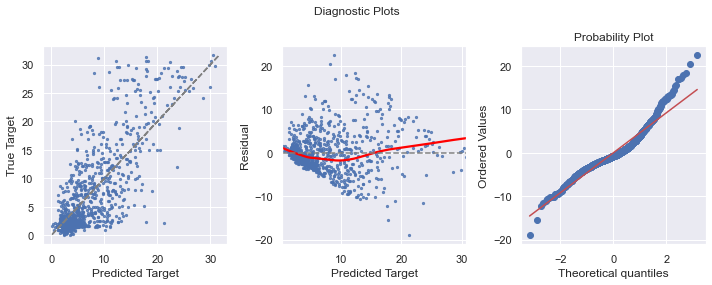

In [228]:
y_pred_poly = y_train - grid_result_poly.predict(X_train_scaled)
diagnostic_plots(grid_result_poly.predict(X_train_scaled), y_train, y_pred_poly)

plt.savefig('diagnosticwithPoly', dpi=500, bbox_inches='tight');


In [260]:
print('MAE for the train data :', MAE(y_train,y_pred_poly))
print('MAE for the train data :', MAE(y_test,y_test - grid_result_poly.predict(X_test_scaled) ))

MAE for the train data : 7.495475680995475
MAE for the train data : 7.6128323875192185


Significant features:

In [ ]:
Age : 0.00
Games : 2.82
Games_Start : -0.36
Min_PG : 0.03
Field_Goals : 2.01
Field_Goals_Attempts : 0.00
3Point_Goals : 0.60
3Point_Goals_Attempts : 0.00
2Point_Goals : 0.00
2Point_Goals_Attempts : 0.00
Effective_Field_Goal_Per : 0.60
Free_Throw : -0.00
Free_Throw_Attempts : 0.00
Offensive_Rebounds : 0.00
Defensive_Rebounds : 0.00
Assists : 0.58
Steals : 0.00
Blocks : 0.00
Turnovers : 0.00
Points : 0.35

In [255]:
cols = ['Games','Games_Start','Min_PG', 'Field_Goals', '3Point_Goals', 'Effective_Field_Goal_Per',
        'Assists', 'Points']

X_train_subset = scaler.fit_transform(X_train[cols].values)
X_test_subset = scaler.transform(X_test[cols].values)




#Setting up a pipeline
pipe2 = Pipeline([('poly', PolynomialFeatures(degree=2)), ('lasso', Lasso())])


#setting up the grid search
grid_poly2 = GridSearchCV(pipe2,param_poly,scoring='r2',cv=kfold)


#fitting grid search to training data
grid_result_poly2 = grid_poly2.fit(X_train_subset, y_train)

# View best parameter
print('Best Score: ', grid_result_poly2.best_score_)
print('Best Param: ', grid_result_poly2.best_params_)


Best Score:  0.38000739403595496
Best Param:  {'lasso__alpha': 0.040370172585965536}


In [258]:
print('Feature coefficient results for the Poly(degree= 2), Lasso with Subset Features: \n')
for feature, coef in zip(X_train[cols].columns, grid_poly2.best_estimator_.steps[1][1].coef_):
    print(feature, ':', f'{coef:.2f}') 



# score fit model on test data
print('R Square for the train data :', grid_result_poly2.score(X_train_subset, y_train))
print('R Square for the test data:', grid_result_poly2.score(X_test_subset, y_test))

Feature coefficient results for the Poly(degree= 2), Lasso with Subset Features: 

Games : 0.00
Games_Start : -1.48
Min_PG : 1.20
Field_Goals : 1.86
3Point_Goals : 0.00
Effective_Field_Goal_Per : -0.01
Assists : 0.54
Points : 1.11
R Square for the train data : 0.4424390832296681
R Square for the test data: 0.4350504164697274


In [256]:
print('Feature coefficient results for the Poly(degree= 2), Lasso with All Numerical Features: \n')
for feature, coef in zip(grid_poly2.best_estimator_.steps[0][1].get_feature_names(), grid_poly2.best_estimator_.steps[1][1].coef_):
    print(feature, ':', f'{coef:.2f}') 






Feature coefficient results for the Poly(degree= 2), Lasso with All Numerical Features: 

1 : 0.00
x0 : -1.48
x1 : 1.20
x2 : 1.86
x3 : 0.00
x4 : -0.01
x5 : 0.54
x6 : 1.11
x7 : 0.92
x0^2 : 0.44
x0 x1 : -1.55
x0 x2 : 0.00
x0 x3 : 0.00
x0 x4 : -0.80
x0 x5 : 0.10
x0 x6 : -0.12
x0 x7 : 0.56
x1^2 : 0.99
x1 x2 : 0.00
x1 x3 : 0.00
x1 x4 : -0.75
x1 x5 : 0.61
x1 x6 : 0.50
x1 x7 : 0.65
x2^2 : 0.00
x2 x3 : 0.00
x2 x4 : 0.00
x2 x5 : -0.25
x2 x6 : 0.24
x2 x7 : 0.00
x3^2 : 0.00
x3 x4 : 0.21
x3 x5 : -0.36
x3 x6 : -0.00
x3 x7 : 0.00
x4^2 : 0.47
x4 x5 : -0.00
x4 x6 : 0.00
x4 x7 : 0.00
x5^2 : -0.03
x5 x6 : 0.57
x5 x7 : -0.00
x6^2 : -0.32
x6 x7 : -0.57
x7^2 : 0.65


# Model 1.e - ElasticNet Regression Model


In [221]:

# Setting up the grid search
grid_elas = GridSearchCV(ElasticNet(),{'alpha':np.logspace(-4, 2, 100)},scoring='r2', cv=5)



#fitting grid search to training data
grid_result_elas = grid_elas.fit(X_train_scaled, y_train)

# View best parameter
print('Best Score: ', grid_elas.best_score_)
print('Best Param: ', grid_elas.best_params_)





Best Score:  0.491294351266711
Best Param:  {'alpha': 0.01519911082952933}


In [223]:
# score fit model on test data
print('R Square for the train data :', grid_result_elas.score(X_train_scaled, y_train))
print('R Square for the test data:', grid_result_elas.score(X_test_scaled, y_test))


R Square for the train data : 0.525532180888943
R Square for the test data: 0.5650205381528404


 ## Model 2 Log Transform of the Salary Variable with All Feature

In [93]:
nba_log = nba.copy()
nba_log['log_Salary'] = np.sqrt(nba_log.Salary)

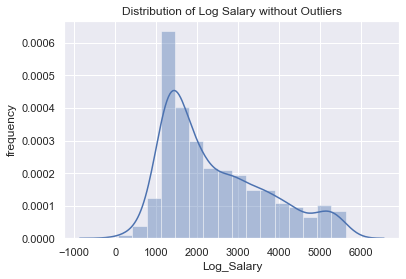

In [227]:
ax =sns.distplot((nba_log['log_Salary']));
ax.set(xlabel='Log_Salary', ylabel='frequency', title='Distribution of Log Salary without Outliers')

plt.savefig('logSalary.png',dpi=500, bbox_inches='tight');

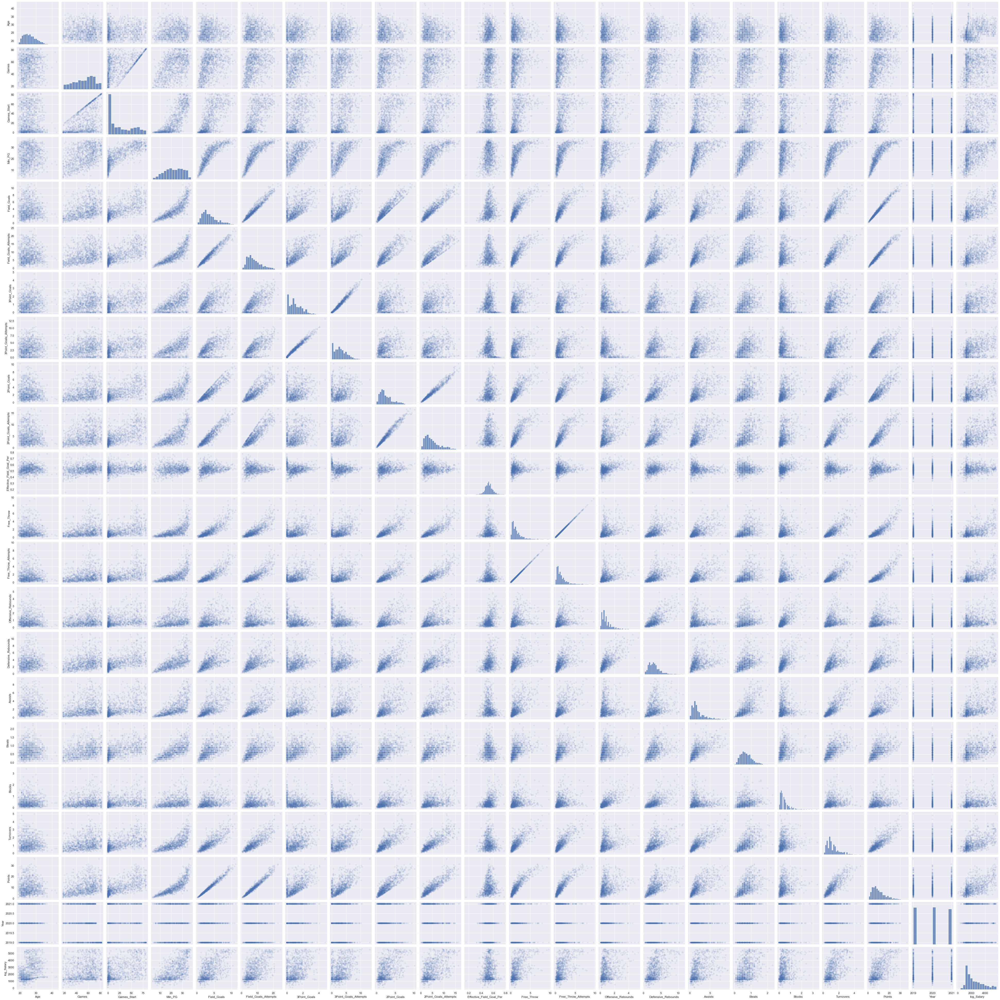

In [94]:
sns.pairplot(nba_log.drop('Salary',axis=1), plot_kws=dict(alpha=.1, edgecolor='none'),dropna=True)
plt.savefig('pairplots_logs', dpi=500, bbox_inches='tight');

In [95]:
(nba_log.corr()['log_Salary'].sort_values( key=pd.Series.abs, ascending=False))

log_Salary                  1.000000
Salary                      0.977829
Points                      0.597141
Field_Goals                 0.594091
Min_PG                      0.593416
Field_Goals_Attempts        0.583215
2Point_Goals_Attempts       0.545796
2Point_Goals                0.534817
Turnovers                   0.532667
Free_Throw_Attempts         0.531539
Free_Throw                  0.531539
Defensive_Rebounds          0.524894
Games_Start                 0.495911
Assists                     0.467031
Steals                      0.424266
Age                         0.378704
3Point_Goals_Attempts       0.367257
3Point_Goals                0.362004
Offensive_Rebounds          0.291112
Blocks                      0.272185
Games                       0.197020
Effective_Field_Goal_Per    0.102930
Year                        0.009020
Name: log_Salary, dtype: float64

The correlations increase slightly in absolute value after log transformation to Salary. 

C:\Users\12157\anaconda3\envs\metis\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\12157\anaconda3\envs\metis\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\12157\anaconda3\envs\metis\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warn

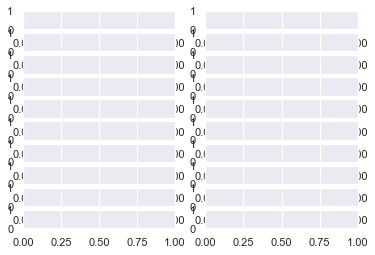

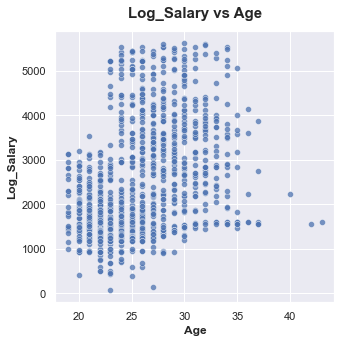

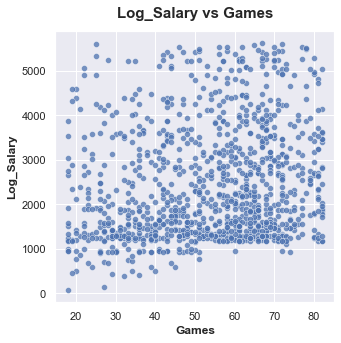

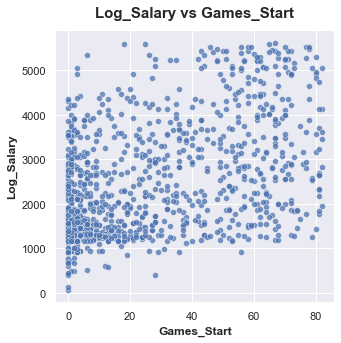

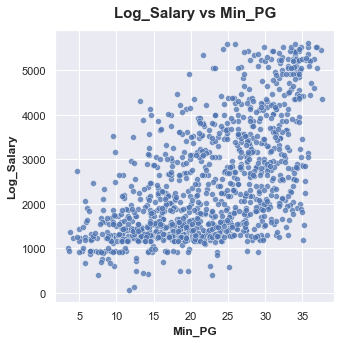

...

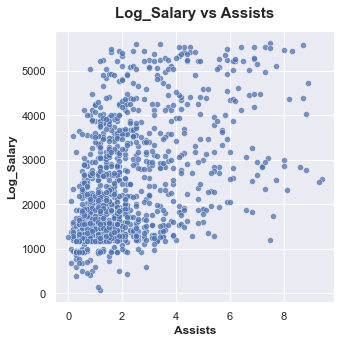

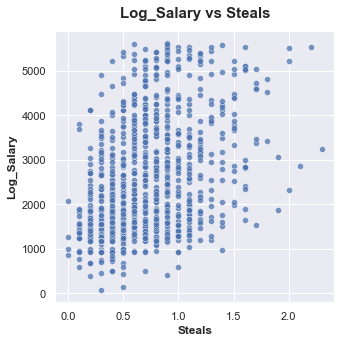

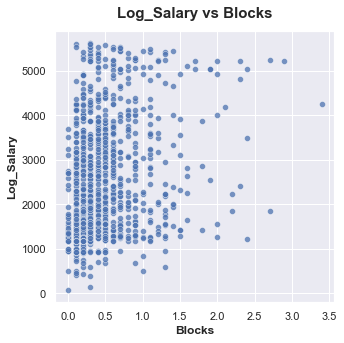

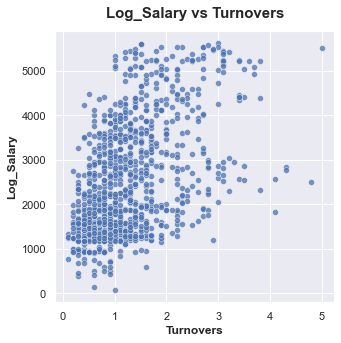

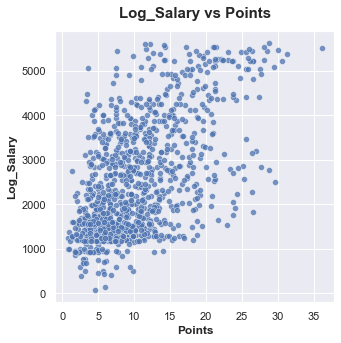

In [96]:
plot_list_columns = ['Age', 'Games', 'Games_Start', 'Min_PG', 'Field_Goals',
       'Field_Goals_Attempts', '3Point_Goals', '3Point_Goals_Attempts',
       '2Point_Goals', '2Point_Goals_Attempts', 'Effective_Field_Goal_Per',
       'Free_Throw', 'Free_Throw_Attempts', 'Offensive_Rebounds',
       'Defensive_Rebounds', 'Assists', 'Steals', 'Blocks', 'Turnovers',
       'Points']

fig, ax =plt.subplots(10,2)
for col in plot_list_columns:
    plt.figure(figsize= (5,5))
    ax = sns.scatterplot(nba_log[col], nba_log['log_Salary'], alpha = 0.75)
    plt.xlabel(xlabel=col, y=1.25, fontsize = 12, weight= 'bold')
    plt.ylabel(ylabel='Log_Salary', x=1.05, fontsize = 12, weight = 'bold')
    plt.title(label = 'Log_Salary' + ' vs ' + col, 
              fontsize = 15, y = 1.025, weight='bold');

In [97]:
nba_log_full = nba_log._get_numeric_data()

X_log, y_log = nba_log_full.drop(columns = ['log_Salary','Salary','Year']), nba_log_full['log_Salary']

In [98]:
#Split the data into test/train

X_train_log, X_test_log, y_train_log, y_test_log = train_test_split(X_log, y_log, test_size=0.2, random_state=42)

In [101]:


scores_logfull = cross_val_score(lin_reg, X_train_log, y_train_log, cv=kfold)
print(scores_logfull)
print("Linear Reg for log Salary Mean R Squared Score: ", np.mean(scores_logfull))

# Build the Model
log_full = lin_reg.fit(X_train_log, y_train_log)

[0.49103717 0.50502437 0.51676689 0.48465321 0.5882268 ]
Linear Reg for log Salary Mean R Squared Score:  0.5171416879247835


In [102]:
print('Feature coefficient results for the Model 2, Log Salary  with All Numerical Features: \n')
for feature, coef in zip(X_train_log.columns, log_full.coef_):
    print(feature, ':', f'{coef:.2f}') 

    
# score fit model on test data
print('R Square, Model 2 for the train data :', lin_reg.score(X_train_log,y_train_log))
print('R Square, Model 2 for the test data:', lin_reg.score(X_test_log,y_test_log))
        

Feature coefficient results for the Model 2, Log Salary  with All Numerical Features: 

Age : 109.25
Games : -7.70
Games_Start : 4.76
Min_PG : 0.71
Field_Goals : 1404.17
Field_Goals_Attempts : 123.41
3Point_Goals : 162.58
3Point_Goals_Attempts : -255.03
2Point_Goals : -652.97
2Point_Goals_Attempts : -110.95
Effective_Field_Goal_Per : -1448.73
Free_Throw : 201.21
Free_Throw_Attempts : 201.21
Offensive_Rebounds : 178.63
Defensive_Rebounds : 106.94
Assists : 92.19
Steals : 106.91
Blocks : 26.78
Turnovers : -81.92
Points : -314.27
R Square, Model 2 for the train data : 0.548381065908798
R Square, Model 2 for the test data: 0.5676586916578017


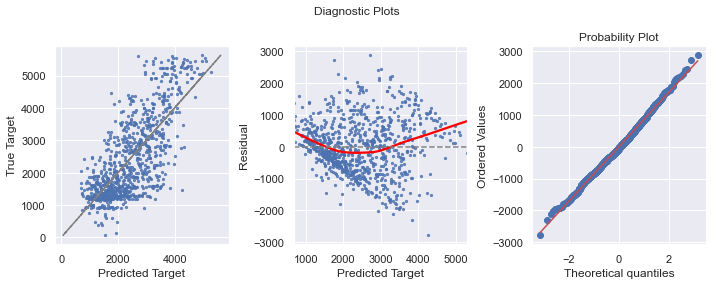

In [104]:
y_pred_log = y_train_log - log_full.predict(X_train_log)
diagnostic_plots(log_full.predict(X_train_log), y_train_log, y_pred_log)

plt.savefig('diagnosticwithLogFull', dpi=500, bbox_inches='tight');



In [106]:
def vif(df_X):
    '''
    Calculate the VIF for each feature of df_X (a Pandas DataFrame).
    '''
    vif_data = [variance_inflation_factor(df_X.values, i)
                for i in range(df_X.shape[1])]
    
    return pd.Series(vif_data, index=df_X.columns)

In [108]:
# the VIF for predictors
vif(X_train_log).sort_values(ascending = False)

# Model 2.a Log Salary, Polynomial degree = 2, Lasso

In [222]:
scaler = StandardScaler()

X_train_log_scaled = scaler.fit_transform(X_train_log.values)
X_test_log_scaled = scaler.transform(X_test_log.values)

#Feature transforms for train, val, and test so that we can run our poly model on each
#poly = PolynomialFeatures(degree=2) 

#X_train_log_poly = poly.fit_transform(X_train_log_scaled)
#X_test_log_poly = poly.transform(X_test_log_scaled)



param_poly =  {'lasso__alpha':np.logspace(-4, 2, 100)}

#Setting up a pipeline
pipe = Pipeline([('poly', PolynomialFeatures(degree=2)), ('lasso', Lasso())])

#pipe.get_params().keys()

#setting up the grid search
grid_polylog = GridSearchCV(pipe,param_poly,scoring='r2',cv=kfold)



#fitting grid search to training data
grid_result_polylog = grid_polylog.fit(X_train_log_scaled, y_train_log)

# View best parameter
print('Best Score: ', grid_result_polylog.best_score_)
print('Best Param: ', grid_result_polylog.best_params_)


Best Score:  0.5545455725717219
Best Param:  {'lasso__alpha': 21.544346900318867}


In [225]:
model2a =  Pipeline([('poly', PolynomialFeatures(degree=2)), ('lasso', LassoCV(alphas= [21.544346900318867], cv = kfold))])

model2a.fit(X_train_log_scaled, y_train_log)

# score fit model on test data
print('R Square for the train data :', model2a.score(X_train_log_scaled, y_train_log))
print('R Square for the test data:', model2a.score(X_test_log_scaled, y_test_log))





R Square for the train data : 0.6048469651943943
R Square for the test data: 0.5764613637862827


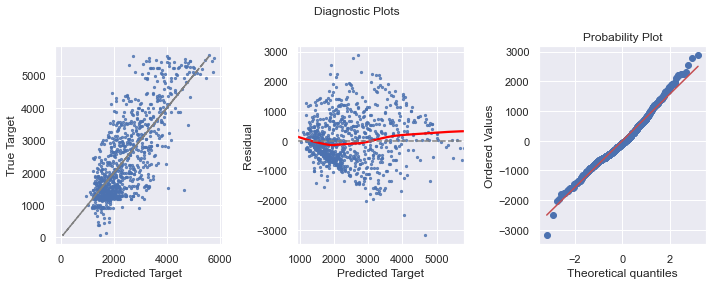

In [226]:
y_pred_logpoly = y_train_log - model2a.predict(X_train_log_scaled)
diagnostic_plots(model2a.predict(X_train_log_scaled), y_train_log, y_pred_logpoly)

plt.savefig('diagnosticwithLogPoly', dpi=500, bbox_inches='tight');


# Model 3 - Log Salary, Subset of Features

In [103]:
nba_log.columns

Index(['Name', 'Team', 'Age', 'Games', 'Games_Start', 'Min_PG', 'Field_Goals',
       'Field_Goals_Attempts', '3Point_Goals', '3Point_Goals_Attempts',
       '2Point_Goals', '2Point_Goals_Attempts', 'Effective_Field_Goal_Per',
       'Free_Throw', 'Free_Throw_Attempts', 'Offensive_Rebounds',
       'Defensive_Rebounds', 'Assists', 'Steals', 'Blocks', 'Turnovers',
       'Points', 'Position', 'Year', 'Salary', 'log_Salary'],
      dtype='object')

In [114]:
cols = ['Age', 'Min_PG', 'Field_Goals',
       'Field_Goals_Attempts', '3Point_Goals', 
       '2Point_Goals', 'Free_Throw', 'Defensive_Rebounds', 'Turnovers',
       'Points']

X_log3, y_log3 = nba_log_full[cols], nba_log_full['log_Salary']


#Split the data into test/train

X_train_log3, X_test_log3, y_train_log3, y_test_log3 = train_test_split(X_log3, y_log3, test_size=0.2, random_state=42)



scores_log3 = cross_val_score(lin_reg, X_train_log3, y_train_log3, cv=kfold)
print(scores_log3)
print("Linear Reg for log Salary Mean R Squared Score: ", np.mean(scores_log3))

# Build the Model
log_3 = lin_reg.fit(X_train_log3, y_train_log3)

print('Feature coefficient results for the Model 3, Log Salary  with Subset Features: \n')
for feature, coef in zip(X_train_log3.columns, log_3.coef_):
    print(feature, ':', f'{coef:.2f}') 

    
# score fit model on test data
print('R Square, Model 3 for the train data :', lin_reg.score(X_train_log3,y_train_log3))
print('R Square, Model 3 for the test data:', lin_reg.score(X_test_log3,y_test_log3))
        


[0.49639804 0.50826794 0.48997199 0.48119798 0.60442072]
Linear Reg for log Salary Mean R Squared Score:  0.516051332033377
Feature coefficient results for the Model 3, Log Salary  with Subset Features: 

Age : 111.13
Min_PG : 13.34
Field_Goals : 1371.71
Field_Goals_Attempts : 54.54
3Point_Goals : -4.30
2Point_Goals : -439.32
Free_Throw : 499.61
Defensive_Rebounds : 136.55
Turnovers : 117.37
Points : -438.14
R Square, Model 3 for the train data : 0.531728310673135
R Square, Model 3 for the test data: 0.5472611351263037


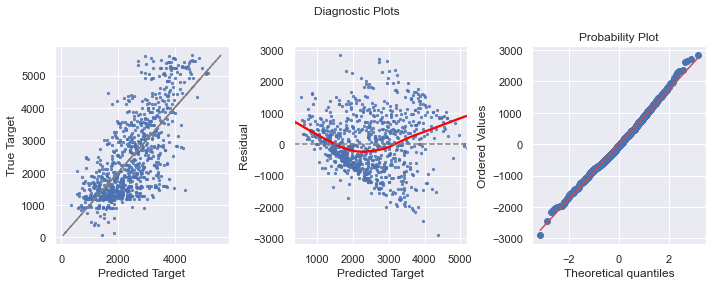

In [115]:
y_pred_log3 = y_train_log3 - log_3.predict(X_train_log3)
diagnostic_plots(log_3.predict(X_train_log3), y_train_log3, y_pred_log3)

plt.savefig('diagnosticwithLog3', dpi=500, bbox_inches='tight');

In [116]:
model_log3 = sm.OLS(y_train_log3, sm.add_constant(X_train_log3))


fit_log3 = model_log3.fit() 
fit_log3.summary()

C:\Users\12157\anaconda3\envs\metis\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             log_Salary   R-squared:                       0.532
Model:                            OLS   Adj. R-squared:                  0.526
Method:                 Least Squares   F-statistic:                     99.13
Date:                Tue, 28 Sep 2021   Prob (F-statistic):          1.85e-136
Time:                        15:19:35   Log-Likelihood:                -7234.2
No. Observations:                 884   AIC:                         1.449e+04
Df Residuals:                     873   BIC:                         1.454e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -2052.7048    207.357     -9.899      0.000   -2459.681   -1645.729
Age                    111.1307      7.499     14.820      0.000      96.413     125.848
Min_PG                  13.3440      8.601      1.552      0.121      -3.536      30.224
Field_Goals           1371.7117    926.975      1.480      0.139    -447.648    3191.071
Field_Goals_Attempts    54.5371     43.900      1.242      0.214     -31.626     140.700
3Point_Goals            -4.3034    815.414     -0.005      0.996   -1604.705    1596.098
2Point_Goals          -439.3203    649.777     -0.676      0.499   -1714.628     835.988
Free_Throw             499.6090    392.688      1.272      0.204    -271.114    1270.332
Defensive_Rebounds     136.5461     25.474      5.360      0.000      86.548     186.544
Turnovers              117.3736     80.598      1.456      0.146     -40.815     275.562
Points                -438.1358    389.535     -1.125      0.261   -1202.671     326.400
==============================================================================
Omnibus:                        7.867   Durbin-Watson:                   1.938
Prob(Omnibus):                  0.020   Jarque-Bera (JB):                7.780
Skew:                           0.222   Prob(JB):                       0.0204
Kurtosis:                       3.116   Cond. No.                     1.44e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.44e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Model 4

In [ ]:
#LASSO with Log Salary - Subset Features
# use grid search to find alpha
alpha = np.logspace(-4, 2, 100)
param_grid = dict(alpha=alpha)
grid = GridSearchCV(Lasso(), param_grid=param_grid, 
                    scoring='neg_mean_absolute_error', cv = kfold)
grid_result = grid.fit(X_train, y_train)


print('Best Score: ', grid_result.best_score_)
print('Best Param: ', grid_result.best_params_)


In [ ]:
#Simple model 
cols = ['Min_PG','Effective_Field_Goal_Per','Age', 'Turnovers','Games', 'Defensive_Rebounds',
                     'Assists', 'Offensive_Rebounds','Steals','Games_Start', 'Blocks']
X_log2, y_log2 = nba_log_full[cols], nba_log_full['log_Salary']


# hold out 20% of the data for final testing
X_log2, X_test_log2, y_log2, y_test_log2 = train_test_split(X_log2, y_log2, test_size=.2, random_state=10)
# perform train/val split
X_train_log2, X_val_log2, y_train_log2, y_val_log2 = train_test_split(X_log2, y_log2, test_size=0.2, random_state=42)
    
model_log2 = sm.OLS(y_train_log2, sm.add_constant(X_train_log2))


fit_log2 = model_log2.fit() 
fit_log2.summary()

In [481]:
X_valid_log2 = sm.add_constant(X_val_log2, has_constant='add') 
#y_valid_log_full = fit_log_full.predict(X_valid_log_full)
#r2_score(y_val, y_valid1)
print('R^2 Score for Test: ') 
round(r2_score(y_val_log2, fit_log2.predict(X_valid_log2)),2)

R^2 Score for Test: 


C:\Users\12157\anaconda3\envs\metis\lib\site-packages\statsmodels\tsa\tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


0.5

In [ ]:
#Simple model 2 with less variable
??????????????
cols = ['Min_PG','Effective_Field_Goal_Per','Age', 'Turnovers','Games', 'Defensive_Rebounds',
                     'Assists', 'Offensive_Rebounds','Steals','Games_Start', 'Blocks']
X_log2, y_log2 = nba_log_full[cols], nba_log_full['log_Salary']


# hold out 20% of the data for final testing
X_log2, X_test_log2, y_log2, y_test_log2 = train_test_split(X_log2, y_log2, test_size=.2, random_state=10)
# perform train/val split
X_train_log2, X_val_log2, y_train_log2, y_val_log2 = train_test_split(X_log2, y_log2, test_size=0.2, random_state=42)
    
model_log2 = sm.OLS(y_train_log2, sm.add_constant(X_train_log2))


fit_log2 = model_log2.fit() 
fit_log2.summary()


#  Skewness


In [200]:
nba_v2.columns

Index(['Name', 'Team', 'Age', 'Games', 'Games_Start', 'Min_PG', 'Field_Goals',
       'Field_Goals_Attempts', '3Point_Goals', '3Point_Goals_Attempts',
       '2Point_Goals', '2Point_Goals_Attempts', 'Effective_Field_Goal_Per',
       'Free_Throw', 'Free_Throw_Attempts', 'Offensive_Rebounds',
       'Defensive_Rebounds', 'Assists', 'Steals', 'Blocks', 'Turnovers',
       'Points', 'Position', 'Year', 'Salary'],
      dtype='object')

In [224]:
nba_v2.skew(numeric_only =True)

Age                          0.532272
Games                       -0.258955
Games_Start                  0.637198
Min_PG                      -0.168036
Field_Goals                  0.932797
Field_Goals_Attempts         0.866153
3Point_Goals                 0.920329
3Point_Goals_Attempts        0.773190
2Point_Goals                 1.129041
2Point_Goals_Attempts        1.034067
Effective_Field_Goal_Per     0.049542
Free_Throw                   2.003820
Free_Throw_Attempts          2.003820
Offensive_Rebounds           1.867818
Defensive_Rebounds           1.365634
Assists                      1.634955
Steals                       0.844989
Blocks                       2.142045
Turnovers                    1.375502
Points                       1.060451
Year                         0.008983
Salary                      24.855505
dtype: float64

Salary column is highly skewed. I will try square root and log transformation to Salary to see if it helps skewness. 

C:\Users\12157\anaconda3\envs\metis\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


[Text(0.5, 0, 'Sqrt Salary'),
 Text(0, 0.5, 'frequency'),
 Text(0.5, 1.0, 'Distribution of Salary')]

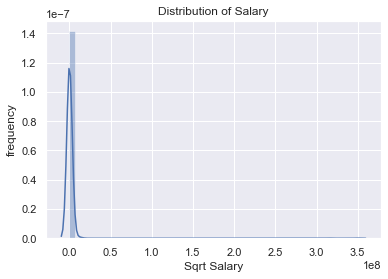

In [226]:
#Sqrt Salary - same as the original data
ax =sns.distplot(np.sqrt(nba_v2['Salary']));
ax.set(xlabel='Sqrt Salary', ylabel='frequency', title='Distribution of Salary')

#np.sqrt(nba_v2.Salary).skew()

3.775132793330746


C:\Users\12157\anaconda3\envs\metis\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


[Text(0.5, 0, 'Log Salary'),
 Text(0, 0.5, 'frequency'),
 Text(0.5, 1.0, 'Distribution of Salary')]

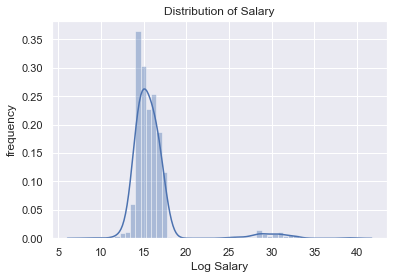

In [229]:
#Skewness is better with log Salary but there is still some data that created skewness
print(np.log(nba_v2['Salary']).skew())

ax = sns.distplot(np.log(nba_v2['Salary']));
ax.set(xlabel='Log Salary', ylabel='frequency', title='Distribution of Salary')



C:\Users\12157\anaconda3\envs\metis\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


[Text(0.5, 0, 'Sqrt Salary'),
 Text(0, 0.5, 'frequency'),
 Text(0.5, 1.0, 'Distribution of Salary')]

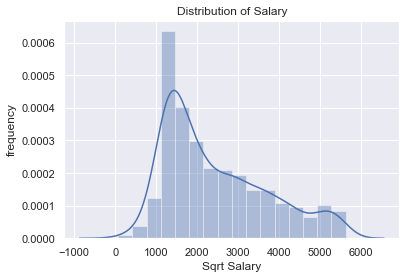

In [243]:
#Sqrt Salary - after removing outlier salaries
ax =sns.distplot(np.sqrt(nba_v2_out['Salary']));
ax.set(xlabel='Sqrt Salary', ylabel='frequency', title='Distribution of Salary without Outliers')

#np.sqrt(nba_v2.Salary).skew()

C:\Users\12157\anaconda3\envs\metis\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


[Text(0.5, 0, 'Log Salary'),
 Text(0, 0.5, 'frequency'),
 Text(0.5, 1.0, 'Distribution of Salary')]

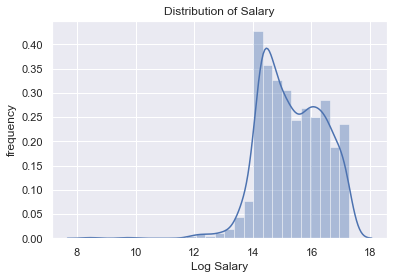

In [242]:
#Skewness of Salary - after removing outlier salaries
ax = sns.distplot(np.log(nba_v2_out['Salary']));
ax.set(xlabel='Log Salary', ylabel='frequency', title='Distribution of Salary without Outliers')


In [245]:
print(np.sqrt(nba_v2_out.Salary).skew())
print(np.log(nba_v2_out.Salary).skew())


0.8010392940178704
-0.3444203200322106


In [256]:
nba_log = nba_v2_out.copy()
nba_log['log_Salary'] = np.sqrt(nba_v2_out.Salary)

C:\Users\12157\anaconda3\envs\metis\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


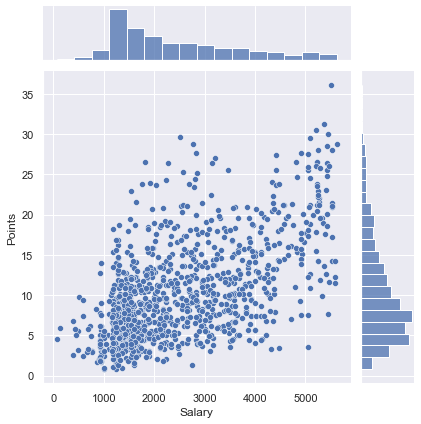

In [252]:
sns.jointplot(np.sqrt(nba_v2_out.Salary), nba_v2_out.Points)

plt.show()

In [182]:
(nba_v2[nba_v2.Salary == 0])['Games'].mean()

15.725190839694656

In [125]:
nba_v2.Position.describe()

count            1599
unique             26
top       Point Guard
freq              217
Name: Position, dtype: object

In [127]:
nba_v2.groupby('Position')['Name'].count()

Position
Center                                                           192
Center and Power Forward                                          75
Point Guard                                                      217
Point Guard and Shooting Guard                                    89
Point Guard and Small Forward                                      3
Power Forward                                                    167
Power Forward and Center                                          93
Power Forward and Small Forward                                   36
Power Forward, Center, and Small Forward                           1
Power Forward, Small Forward, Shooting Guard, and Point Guard      3
Power Forward, Small Forward, and Center                           6
Power Forward, Small Forward, and Shooting Guard                   3
Shooting Guard                                                   209
Shooting Guard and Point Guard                                    76
Shooting Guard and Small 